In [8]:
from pathlib import Path
import pickle

import mne
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [5]:
sub = "2"
feat = "bert"
sig = np.load(f"../reports/sub-{sub}/{feat}_s0_predictions/0_sig_group_corrected.npy")

In [7]:
sig.shape

(16848,)

In [72]:
REPORTS = Path("../reports")

from statsmodels.stats.multitest import fdrcorrection

all_subjects = [str(i) for i in range(1, 9)]
all_features = ["bert", "glove", "postag", "deptag", "cm"]

missing_sig = []

all_uncorrected_sig = []
for sub in all_subjects:
    for feat in tqdm(all_features, f"Subject: {sub}"):
        sig_file = REPORTS / f"sub-{sub}" / f"{feat}_s0_predictions" / "0_sig.npy" 
        if not sig_file.exists():
            missing_sig.append((sub, feat))
            continue
        uncorrected_sig = np.load(sig_file)
        all_uncorrected_sig.append(uncorrected_sig)
        
q = 0.2
rejected, corrected = fdrcorrection(np.hstack(all_uncorrected_sig), q)

Subject: 8: 100%|███████████████████████████████| 5/5 [00:00<00:00, 3640.89it/s]


In [73]:
last_end = 0
ind = 0
corr_sig = {}
h0_rejected = {}
for sub in all_subjects:
    for feat in all_features:
        if (sub, feat) in missing_sig:
            continue
        corr_sig[feat+sub] = corrected[last_end:last_end + all_uncorrected_sig[ind].shape[0]]
        h0_rejected[feat+sub] = rejected[last_end:last_end + all_uncorrected_sig[ind].shape[0]]

        last_end += all_uncorrected_sig[ind].shape[0]
        ind += 1

In [74]:
corrected.shape, rejected.shape

((320112,), (320112,))

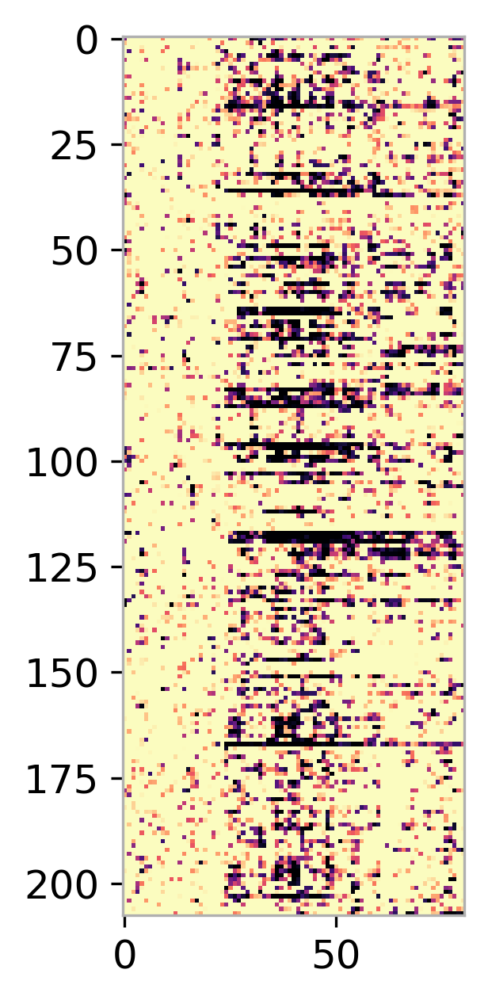

In [75]:
plt.imshow(corr_sig["bert2"].reshape(208, 81))
plt.show()

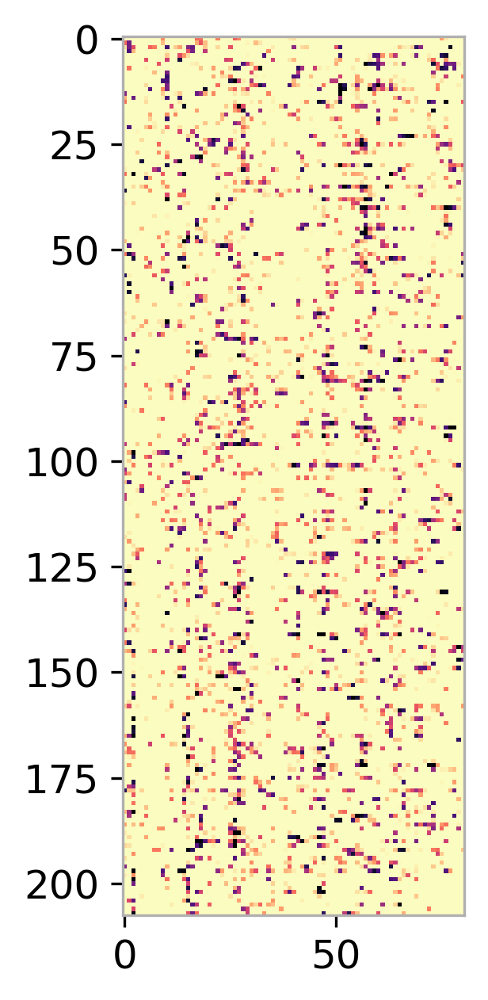

In [41]:
plt.imshow(corr_sig["glove2"].reshape(208, 81))

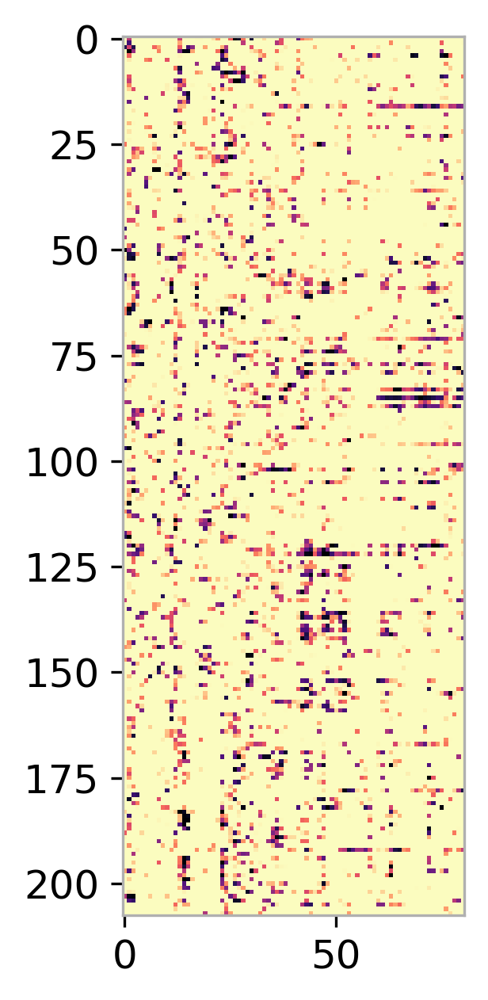

In [42]:
plt.imshow(corr_sig["postag2"].reshape(208, 81))

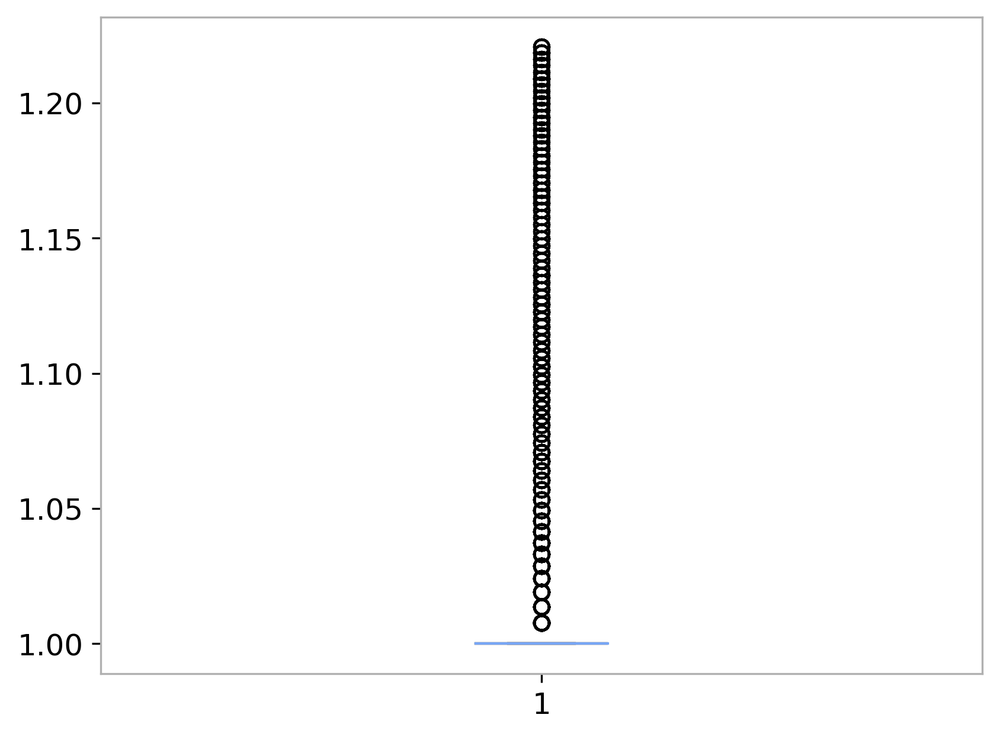

In [90]:
plt.boxplot(np.exp(corr))
plt.show()

In [44]:
with open("../data/formatted/word/info-12-word-100Hz-800ms-no-baseline.pkl", "rb") as fp:
        info = pickle.load(fp)

In [109]:
r2 = np.load( REPORTS / f"sub-2" / f"bert_s0_predictions" / "0_r2s.npy" )

In [114]:
r2s = r2.copy()
r2s[~h0_rejected["bert2"]] = 0.0

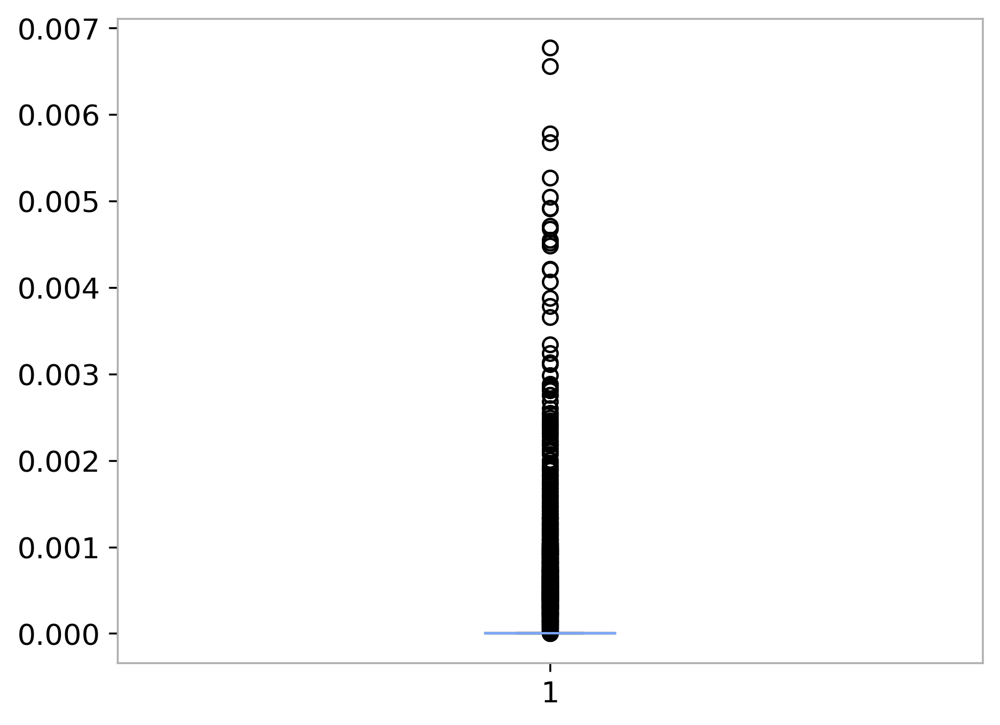

In [118]:
plt.boxplot(np.clip(r2s, 0, None))
plt.show()

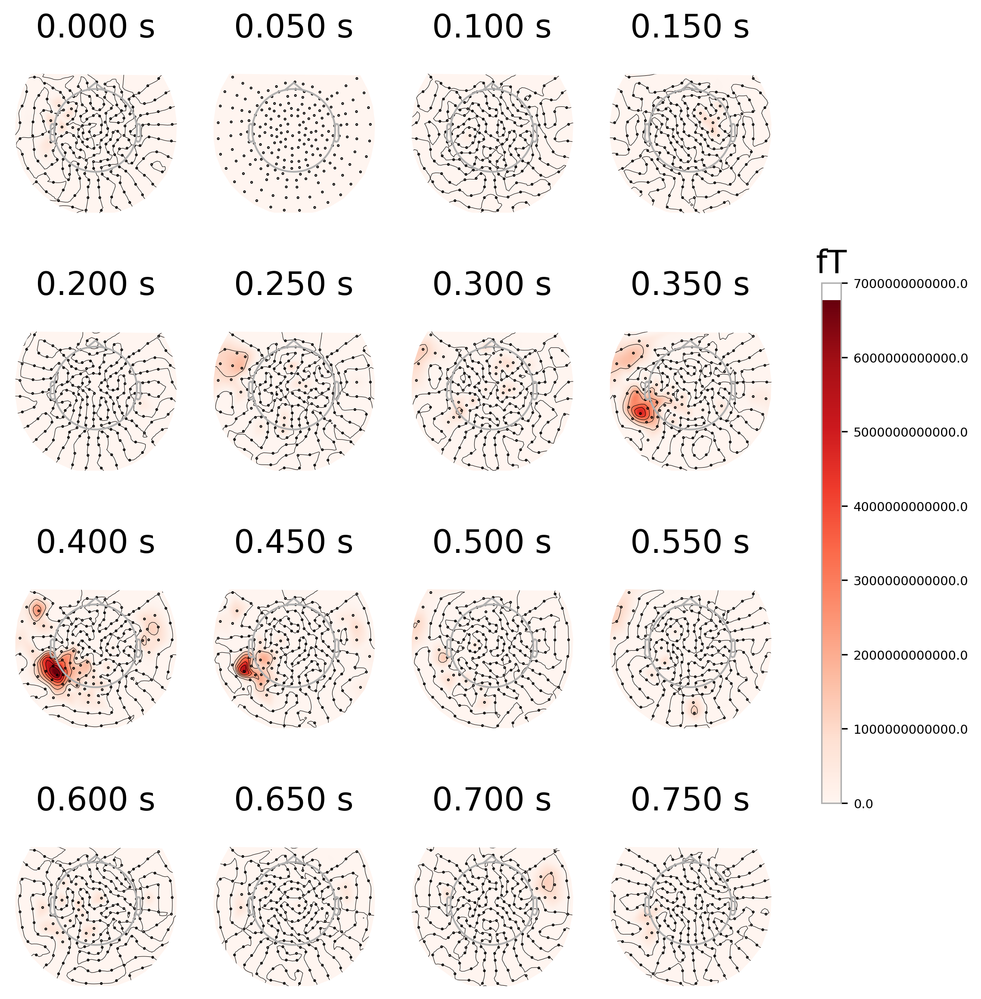

In [126]:
evo = mne.EvokedArray(np.clip(r2s, 0, None).reshape(208, 81), info)
times = np.arange(0.0, 0.8, 0.05)
evo.plot_topomap(times, cmap="Reds", ncols=4, nrows=4, vlim=(0.0, None))
plt.show()

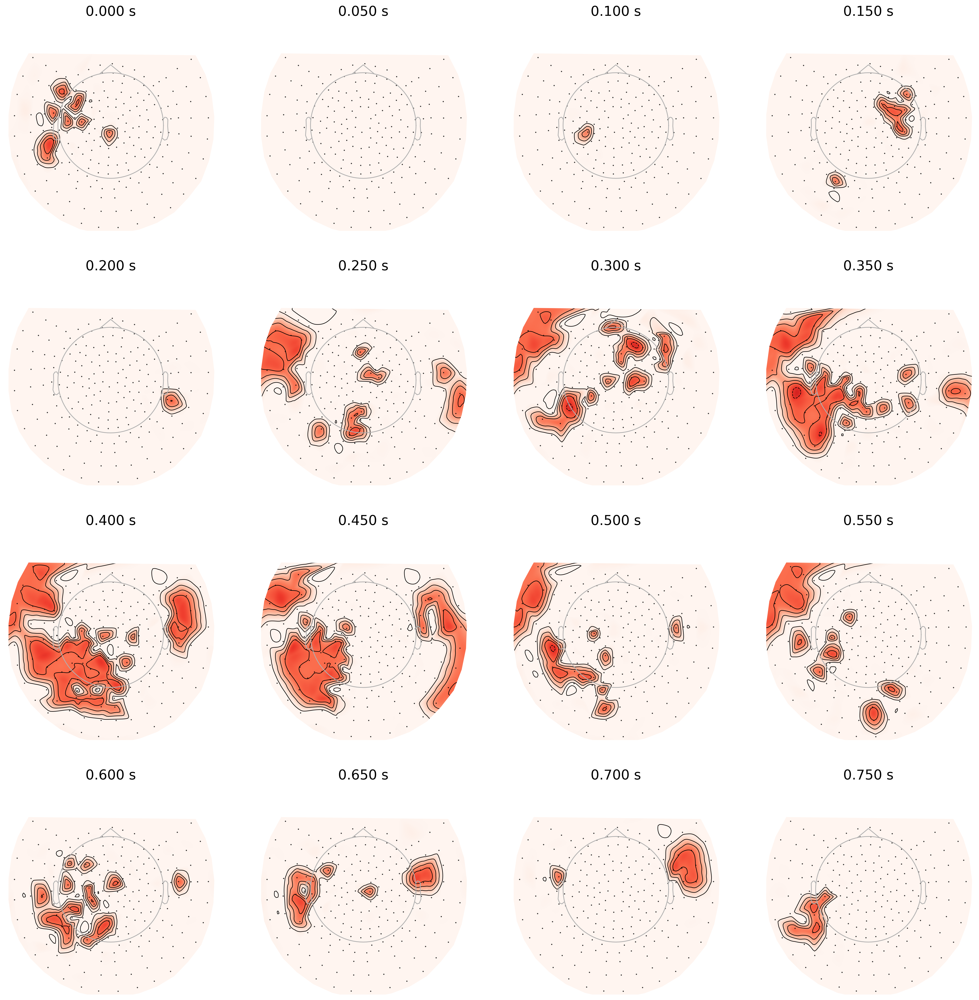

<Figure size 1920x1440 with 0 Axes>

In [132]:
corr = corr_sig["bert2"].copy()
corr[~h0_rejected["bert2"]] = 1.0
evo = mne.EvokedArray(corr.reshape(208, 81), info)
times = np.arange(0.0, 0.8, 0.05)
evo.plot_topomap(times, cmap="Reds_r", ncols=4, nrows=4, colorbar=False, res=128, size=3)
plt.savefig("../figures/sig-corrected-bert-2.pdf")
plt.show()

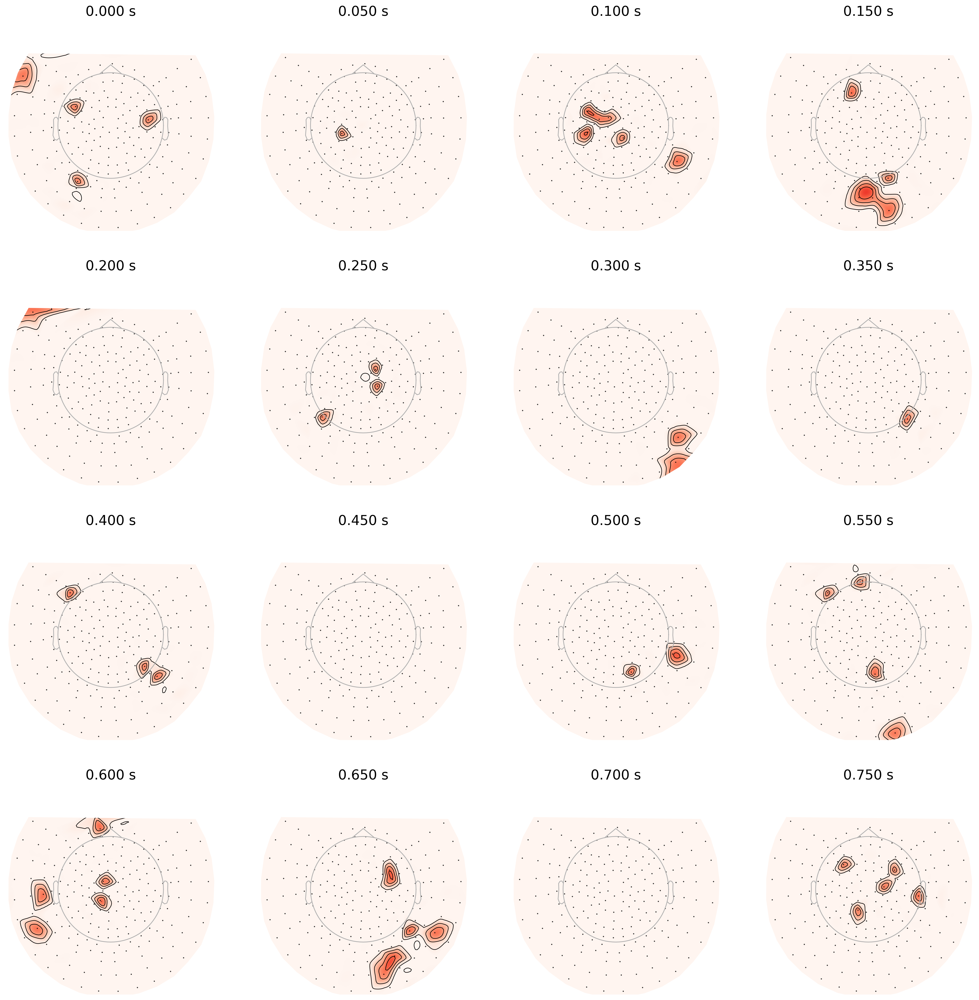

<Figure size 1920x1440 with 0 Axes>

In [133]:
corr = corr_sig["glove2"].copy()
corr[~h0_rejected["glove2"]] = 1.0
evo = mne.EvokedArray(corr.reshape(208, 81), info)
times = np.arange(0.0, 0.8, 0.05)
evo.plot_topomap(times, cmap="Reds_r", ncols=4, nrows=4, colorbar=False, res=128, size=3)
plt.savefig("../figures/sig-corrected-glove-2.pdf")
plt.show()

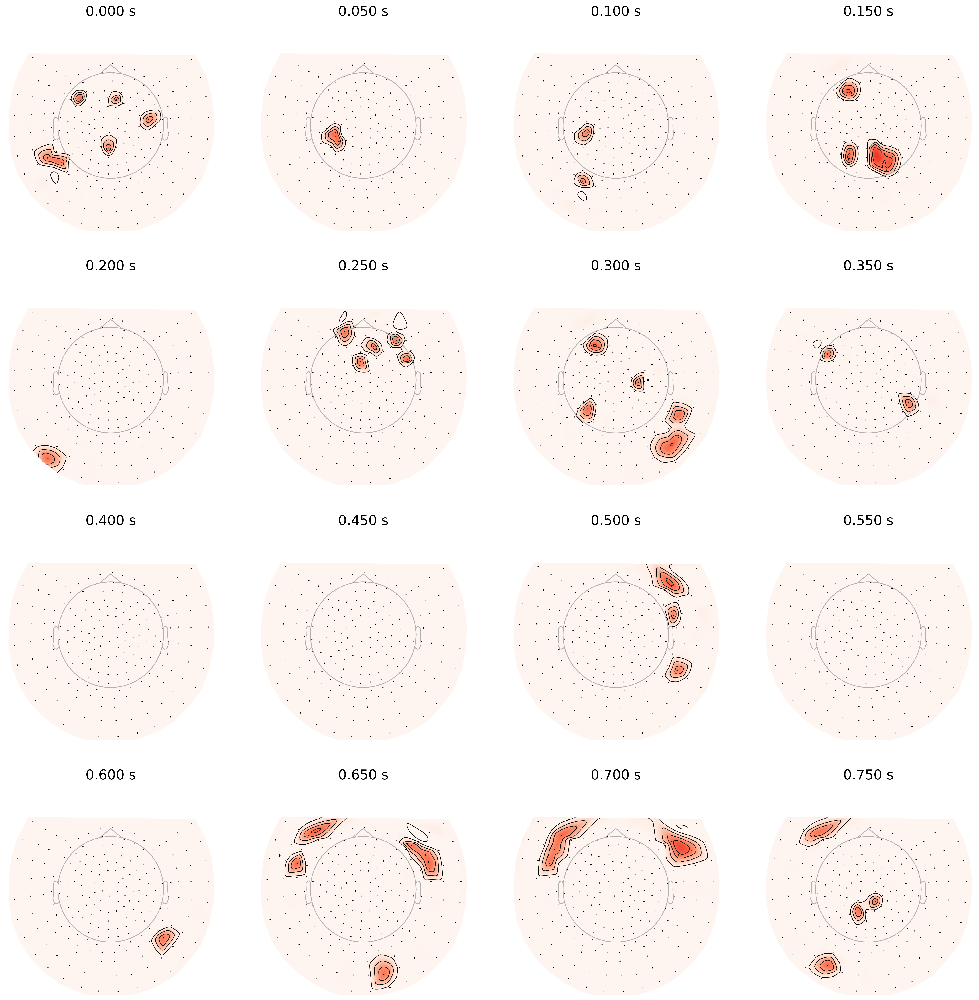

<Figure size 1920x1440 with 0 Axes>

In [139]:
corr = corr_sig["postag2"].copy()
corr[~h0_rejected["postag2"]] = 1.0
evo = mne.EvokedArray(corr.reshape(208, 81), info)
times = np.arange(0.0, 0.8, 0.05)
evo.plot_topomap(times, cmap="Reds_r", ncols=4, nrows=4, colorbar=False, res=128, size=3)
plt.savefig("../figures/sig-corrected-postag-2.pdf")
plt.show()